<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/ResNet101V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/MyDrive/dataset brain tumor/dataset


In [3]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

Archive:  axial_t1wce_2_class.zip
  inflating: /dataset unzipped/axial_t1wce_2_class/axial_t1wce_2_class.yaml  
   creating: /dataset unzipped/axial_t1wce_2_class/images/
   creating: /dataset unzipped/axial_t1wce_2_class/images/test/
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_101.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_109.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_111.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_117.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_121.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_126.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_134.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_66.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_75.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/image

In [4]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

Archive:  coronal_t1wce_2_class.zip
  inflating: /dataset unzipped/coronal_t1wce_2_class/coronal_t1wce_2_class.yaml  
   creating: /dataset unzipped/coronal_t1wce_2_class/images/
   creating: /dataset unzipped/coronal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/13.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/15.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/17.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/19.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/20.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/23.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/33.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/34.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/35.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/36.jpg  
  inflating: /d

In [5]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

Archive:  sagittal_t1wce_2_class.zip
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_102.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_121.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_140.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_159.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_110.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_129.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_147.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_166.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_154.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_173.jpg  
  inflating: /

In [6]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import imutils

In [7]:
%cd '/dataset unzipped'

/dataset unzipped


In [8]:
def crop_brain_contour(image, plot=False):
    
    #import imutils
    #import cv2
    #from matplotlib import pyplot as plt
    
    # Convert the image to grayscale, and blur it slightl
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    #thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)[1]
    #thresh = cv2.erode(thresh, None, iterations=2)
    #thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image,extLeft,extRight,extTop,extBot

In [9]:
#Bounding box with one tumor
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
X_train = []
bb = []
count = 0;
temp_array  = []
extLeft_coords_x = []
extLeft_coords_y = []
extRight_coords_x = []
extRight_coords_y = []
extTop_coords_x = []
extTop_coords_y = []
extBot_coords_x = []
extBot_coords_y = []
image_width = []
image_height = []


extLeft_coords_x_test = []
extLeft_coords_y_test = []
extRight_coords_x_test = []
extRight_coords_y_test = []
extTop_coords_x_test = []
extTop_coords_y_test = []
extBot_coords_x_test = []
extBot_coords_y_test = []
images_width_test = []
images_height_test = []
width_new_im = []
height_new_im = []
traslazione_x_test = []
traslazione_y_test = []

image_size = 224

for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        image_width.append(img.shape[1])
        image_height.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image,extLeft,extRight,extTop,extBot = crop_brain_contour(img,False)
        extLeft_coords_x.append(extLeft[0])
        extLeft_coords_y.append(extLeft[1])
        extRight_coords_x.append(extRight[0])
        extRight_coords_y.append(extRight[1])
        extTop_coords_x.append(extTop[0])
        extTop_coords_y.append(extTop[1])
        extBot_coords_x.append(extBot[0])
        extBot_coords_y.append(extBot[1])
        # resize image
        image = cv2.resize(image, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_train.append(image)

image_index = 0
#bb_train = np.zeros((len(X_train),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                 
                temp_array[0] = temp_array[0]*image_width[count] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x[count]
                temp_array[0] = (temp_array[0]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                temp_array[1] = temp_array[1]*image_height[count]
                temp_array[1] = temp_array[1]-extTop_coords_y[count]
                temp_array[1] = (temp_array[1]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size
                
                temp_array[2] = temp_array[2]*(image_width[count])
                temp_array[2] = (temp_array[2]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                
                temp_array[3] = temp_array[3]*(image_height[count])
                temp_array[3] = (temp_array[3]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size                 
            
                lbls_array.append(temp_array)

                #print(temp_array)
                #bb_train[image_index] = np.array([temp_array])
                #print(bb_train[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_train: ', len(X_train))
print('bb_list: ', len(bb_list))

for i in range(len(X_train)):
  if(len(duplicate_img[i]) == 2):
    X_train.append(X_train[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata
bb_train = np.zeros((len(X_train),4))

for j in range(len(bb_list)):
  bb_train[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_train: ', len(X_train))
print('bb_train: ', len(bb_train))

X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        images_width_test.append(img.shape[1])
        images_height_test.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image_test,extLeft_test,extRight_test,extTop_test,extBot_test = crop_brain_contour(img,False)
        extLeft_coords_x_test.append(extLeft_test[0])
        extLeft_coords_y_test.append(extLeft_test[1])
        extRight_coords_x_test.append(extRight_test[0])
        extRight_coords_y_test.append(extRight_test[1])
        extTop_coords_x_test.append(extTop_test[0])
        extTop_coords_y_test.append(extTop_test[1])
        extBot_coords_x_test.append(extBot_test[0])
        extBot_coords_y_test.append(extBot_test[1])
        # resize image
        image_test = cv2.resize(image_test, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_test.append(image_test)

image_index = 0
count_test = 0;
#bb_test = np.zeros((len(X_test),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                #width_new_im.append(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test])
                #height_new_im.append(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test])
                
                
                temp_array[0] = temp_array[0]*images_width_test[count_test] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x_test[count_test]
                temp_array[0] = (temp_array[0]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                temp_array[1] = temp_array[1]*images_height_test[count_test]
                temp_array[1] = temp_array[1]-extTop_coords_y_test[count_test]
                temp_array[1] = (temp_array[1]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size
                
                temp_array[2] = temp_array[2]*(images_width_test[count_test])
                temp_array[2] = (temp_array[2]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                
                temp_array[3] = temp_array[3]*(images_height_test[count_test])
                temp_array[3] = (temp_array[3]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size                 
            
                lbls_array.append(temp_array)

                #bb_test[image_index] = np.array([temp_array])
                #print(bb_test[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count_test += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_test: ', len(X_test))
print('bb_list: ', len(bb_list))

for i in range(len(X_test)):
  if(len(duplicate_img[i]) == 2):
    X_test.append(X_test[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata

bb_test = np.zeros((len(X_test),4))

for j in range(len(bb_test)):
  bb_test[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_test: ', len(X_test))
print('bb_test: ', len(bb_test))

#print(bb_test[30])
#print(extRight_coords_x_test[30])
#print(extLeft_coords_x_test[30])

Dimensione delle liste prima di duplicare le immagini:
X_train:  878
bb_list:  878
Dimensione delle liste dopo la duplicazione delle immagini:
X_train:  919
bb_train:  919
Dimensione delle liste prima di duplicare le immagini:
X_test:  223
bb_list:  223
Dimensione delle liste dopo la duplicazione delle immagini:
X_test:  237
bb_test:  237


In [10]:
len(X_train)

919

In [11]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [12]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [13]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [14]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [15]:
BATCH_SIZE = 16
#save_path = os.path.join('./', 'model_effnet')
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [16]:
METRIC_THRESH = 0.3

def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):


        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2
    
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2
    
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)


        # This must match the type used in py_func
        results.append(iou)
    return np.mean(results)

def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou



In [17]:
#def iou(y_true,y_pred):
  #pred_bbox_val = model.predict(X_val)
  #iou = tf.numpy_function(calculate_iou,[y_true,y_pred],tf.float32)
  #return iou

In [18]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in rosso
        xmin, ymin, width, height = bbox_coords
        img = cv2.rectangle(img, (int(xmin-width/2), int(ymin-height/2)), (int(xmin+width/2), int(ymin+height/2)), (255, 0, 0), 1)
        #img = cv2.rectangle(img, (0,0),(10,10), (0, 0, 255), 1)
    if len(pred_coords) == 4: #in verde
        xmin1, ymin1, width1, height1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-width1/2), int(ymin1-height1/2)), (int(xmin1+width1/2), int(ymin1+height1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [19]:
#To test the model
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]
    #example, label = next(datagen)
    #X = example['image']
    #y = label['coords']
    #pred_bbox = model.predict(X)[0]
    #img = X[0]
    #gt_coords = y[0]
    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [20]:
%cd '../content/drive/MyDrive'
! mkdir  model_checkpoint_RESNET

/content/drive/MyDrive
mkdir: cannot create directory ‘model_checkpoint_RESNET’: File exists


In [21]:
save_path = './model_checkpoint_RESNET/model_RESNET.h5'

In [23]:
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=50,
),

    ShowTestImages()
]

In [24]:
resnet = ResNet101V2(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))
model = resnet.output
model = tf.keras.layers.AveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=resnet.inputs, outputs = model)

171317808/171317808 [==============================] - 7s 0us/step


In [25]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 28.6760 - IoU: 0.1112
Epoch 1: val_loss improved from inf to 38.45266, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 137ms/step


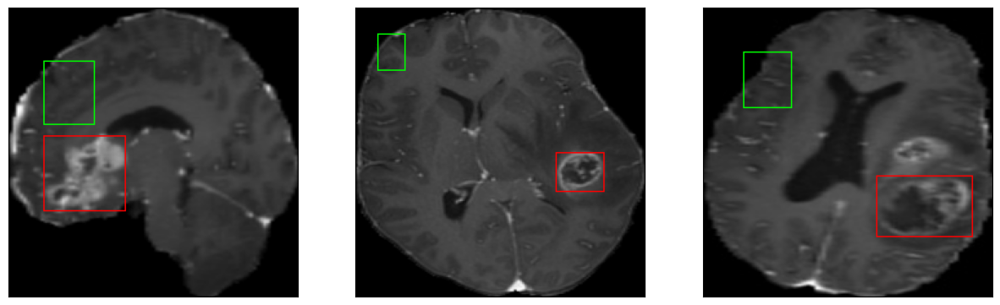

52/52 [==============================] - 120s 841ms/step - loss: 28.6760 - IoU: 0.1112 - val_loss: 38.4527 - val_IoU: 0.0523
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 16.7521 - IoU: 0.2802
Epoch 2: val_loss did not improve from 38.45266
8/8 [==============================] - 1s 141ms/step


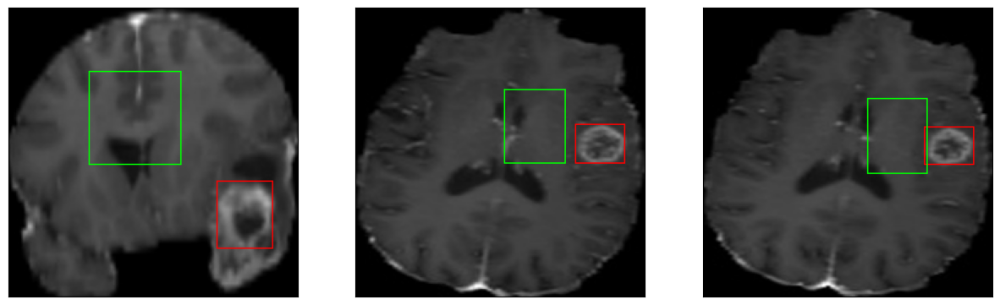

52/52 [==============================] - 19s 375ms/step - loss: 16.7521 - IoU: 0.2802 - val_loss: 104.3153 - val_IoU: 0.0443
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 13.2740 - IoU: 0.3635
Epoch 3: val_loss did not improve from 38.45266
8/8 [==============================] - 1s 143ms/step


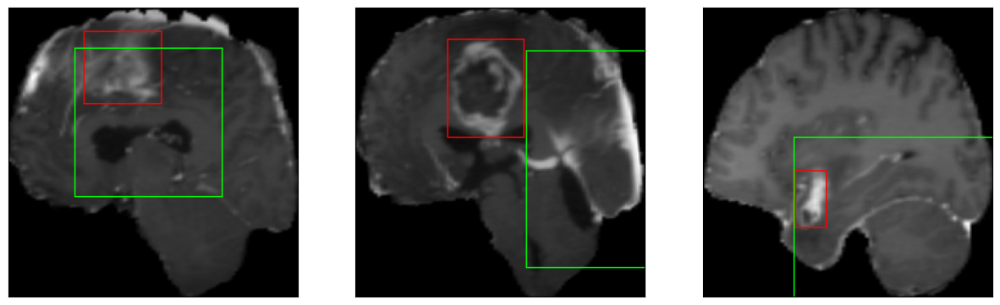

52/52 [==============================] - 19s 376ms/step - loss: 13.2740 - IoU: 0.3635 - val_loss: 101.9201 - val_IoU: 0.0390
Epoch 4/100
52/52 [==============================] - ETA: 0s - loss: 12.0085 - IoU: 0.3966
Epoch 4: val_loss improved from 38.45266 to 22.11316, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


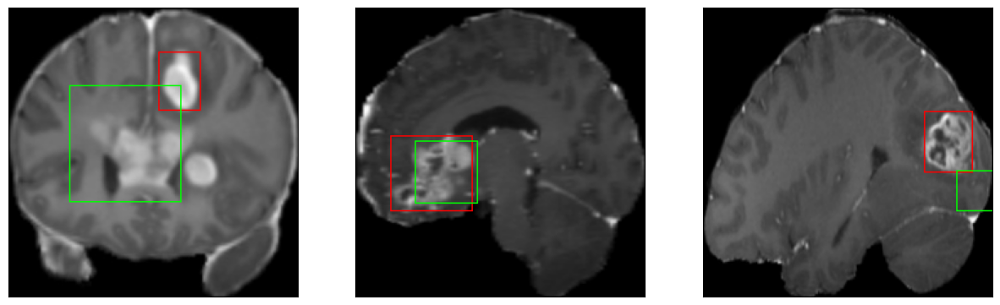

52/52 [==============================] - 31s 609ms/step - loss: 12.0085 - IoU: 0.3966 - val_loss: 22.1132 - val_IoU: 0.2837
Epoch 5/100
52/52 [==============================] - ETA: 0s - loss: 11.4202 - IoU: 0.4120
Epoch 5: val_loss improved from 22.11316 to 21.27529, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


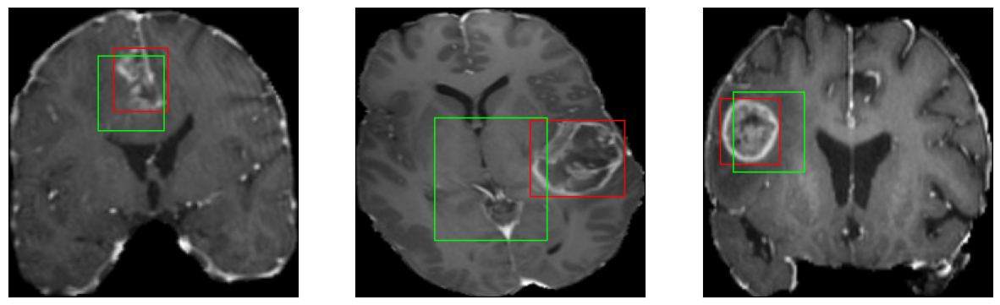

52/52 [==============================] - 32s 627ms/step - loss: 11.4202 - IoU: 0.4120 - val_loss: 21.2753 - val_IoU: 0.2993
Epoch 6/100
52/52 [==============================] - ETA: 0s - loss: 10.1566 - IoU: 0.4599
Epoch 6: val_loss did not improve from 21.27529
8/8 [==============================] - 1s 146ms/step


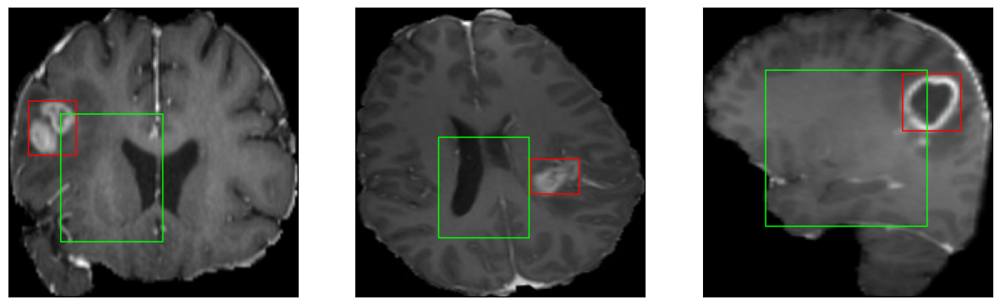

52/52 [==============================] - 20s 387ms/step - loss: 10.1566 - IoU: 0.4599 - val_loss: 33.3577 - val_IoU: 0.2067
Epoch 7/100
52/52 [==============================] - ETA: 0s - loss: 9.5161 - IoU: 0.4872
Epoch 7: val_loss improved from 21.27529 to 17.02486, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


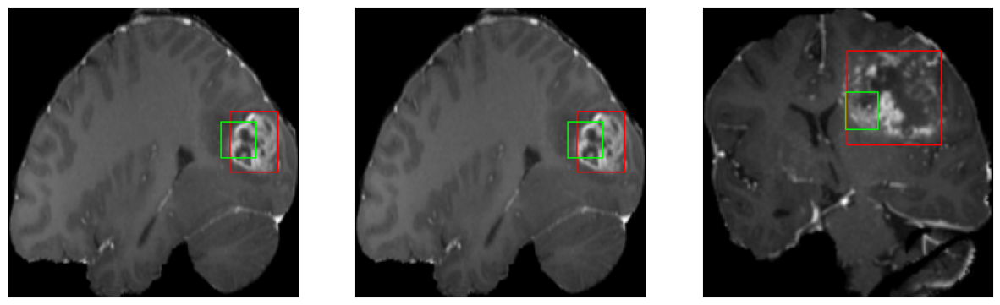

52/52 [==============================] - 32s 618ms/step - loss: 9.5161 - IoU: 0.4872 - val_loss: 17.0249 - val_IoU: 0.3292
Epoch 8/100
52/52 [==============================] - ETA: 0s - loss: 8.7703 - IoU: 0.5099
Epoch 8: val_loss improved from 17.02486 to 10.07470, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


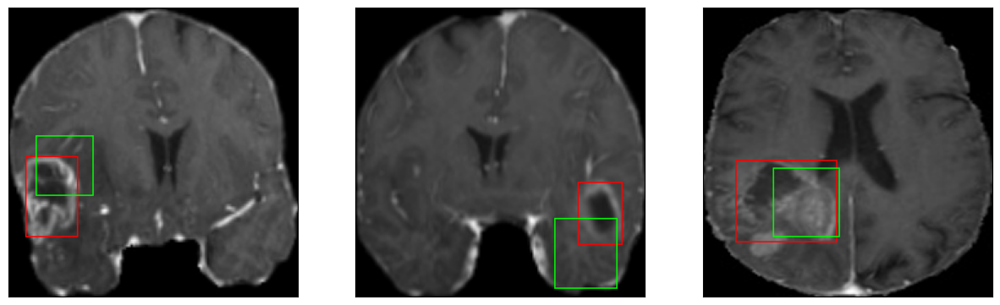

52/52 [==============================] - 31s 597ms/step - loss: 8.7703 - IoU: 0.5099 - val_loss: 10.0747 - val_IoU: 0.4910
Epoch 9/100
52/52 [==============================] - ETA: 0s - loss: 8.5228 - IoU: 0.5076
Epoch 9: val_loss did not improve from 10.07470
8/8 [==============================] - 1s 148ms/step


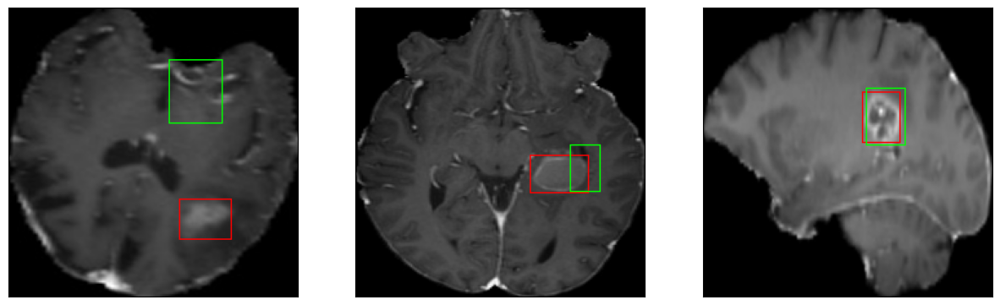

52/52 [==============================] - 20s 390ms/step - loss: 8.5228 - IoU: 0.5076 - val_loss: 10.3770 - val_IoU: 0.4738
Epoch 10/100
52/52 [==============================] - ETA: 0s - loss: 7.8899 - IoU: 0.5414
Epoch 10: val_loss improved from 10.07470 to 8.63776, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


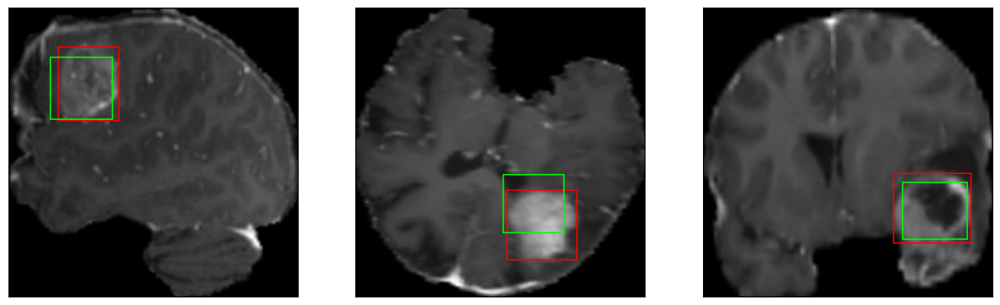

52/52 [==============================] - 37s 716ms/step - loss: 7.8899 - IoU: 0.5414 - val_loss: 8.6378 - val_IoU: 0.5339
Epoch 11/100
52/52 [==============================] - ETA: 0s - loss: 8.3087 - IoU: 0.5189
Epoch 11: val_loss did not improve from 8.63776
8/8 [==============================] - 1s 144ms/step


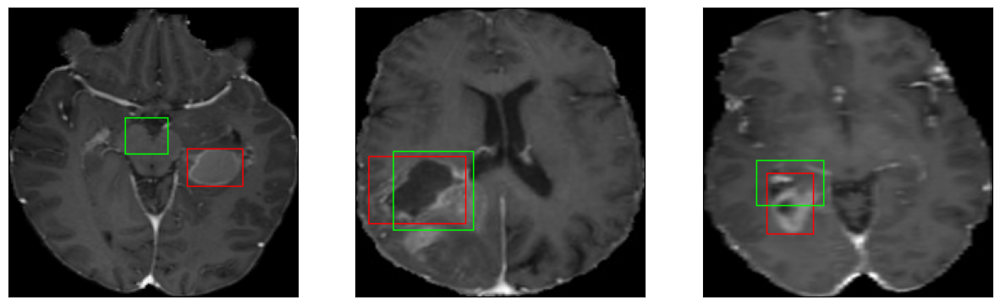

52/52 [==============================] - 20s 392ms/step - loss: 8.3087 - IoU: 0.5189 - val_loss: 10.5417 - val_IoU: 0.4573
Epoch 12/100
52/52 [==============================] - ETA: 0s - loss: 7.6827 - IoU: 0.5446
Epoch 12: val_loss did not improve from 8.63776
8/8 [==============================] - 1s 147ms/step


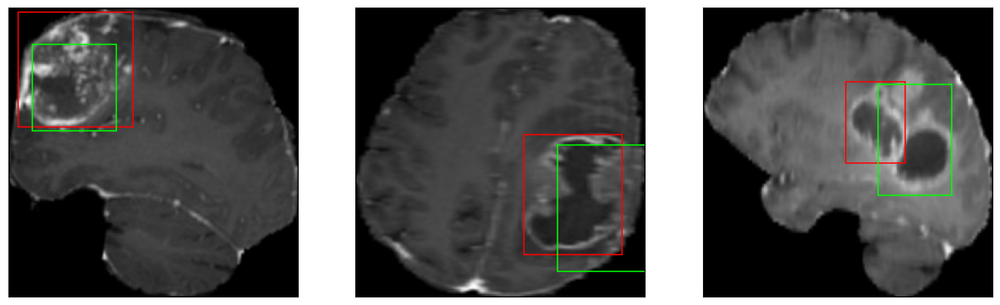

52/52 [==============================] - 20s 383ms/step - loss: 7.6827 - IoU: 0.5446 - val_loss: 9.3129 - val_IoU: 0.4656
Epoch 13/100
52/52 [==============================] - ETA: 0s - loss: 7.1972 - IoU: 0.5593
Epoch 13: val_loss improved from 8.63776 to 8.15196, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


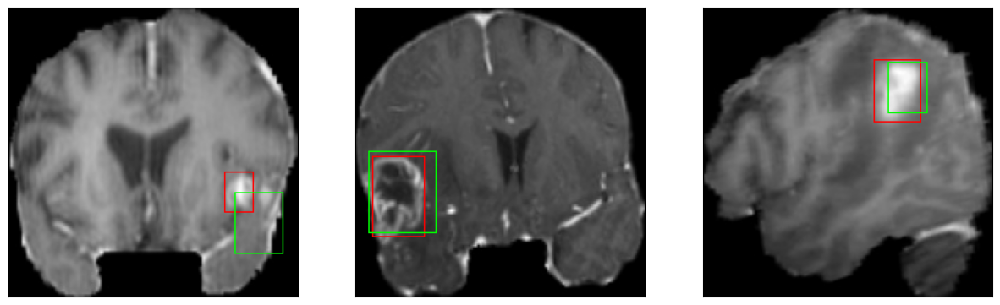

52/52 [==============================] - 38s 741ms/step - loss: 7.1972 - IoU: 0.5593 - val_loss: 8.1520 - val_IoU: 0.5211
Epoch 14/100
52/52 [==============================] - ETA: 0s - loss: 7.0508 - IoU: 0.5710
Epoch 14: val_loss improved from 8.15196 to 7.84298, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


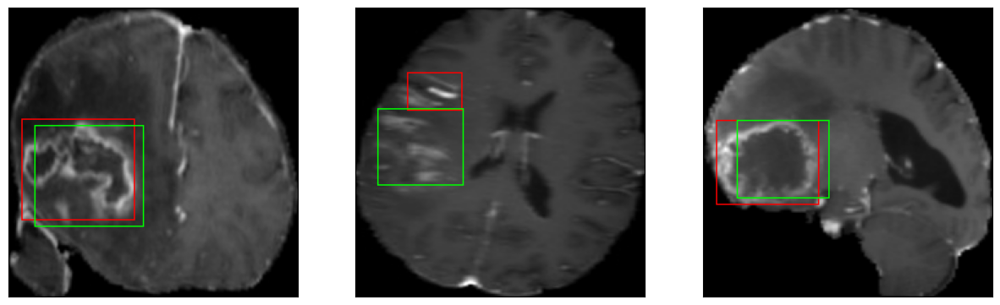

52/52 [==============================] - 37s 713ms/step - loss: 7.0508 - IoU: 0.5710 - val_loss: 7.8430 - val_IoU: 0.5312
Epoch 15/100
52/52 [==============================] - ETA: 0s - loss: 7.3100 - IoU: 0.5514
Epoch 15: val_loss did not improve from 7.84298
8/8 [==============================] - 1s 148ms/step


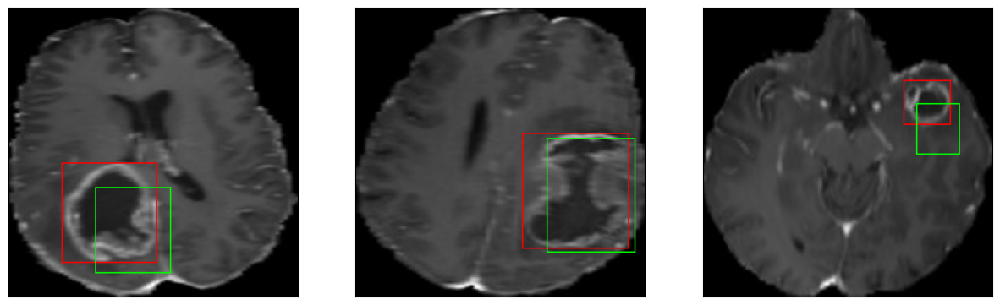

52/52 [==============================] - 20s 390ms/step - loss: 7.3100 - IoU: 0.5514 - val_loss: 10.7906 - val_IoU: 0.3707
Epoch 16/100
52/52 [==============================] - ETA: 0s - loss: 7.3410 - IoU: 0.5448
Epoch 16: val_loss did not improve from 7.84298
8/8 [==============================] - 1s 144ms/step


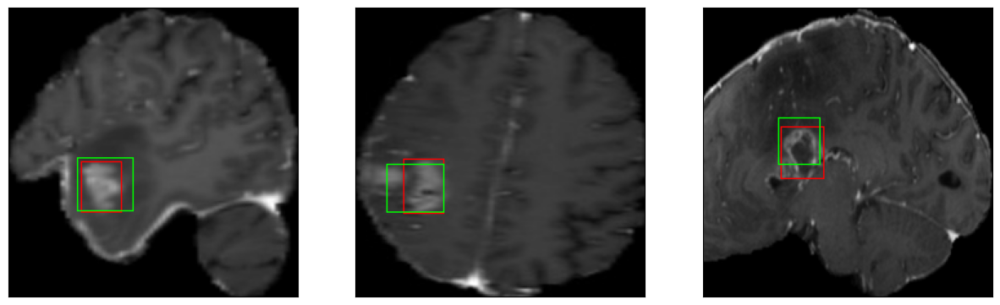

52/52 [==============================] - 21s 399ms/step - loss: 7.3410 - IoU: 0.5448 - val_loss: 9.5670 - val_IoU: 0.5366
Epoch 17/100
52/52 [==============================] - ETA: 0s - loss: 7.0293 - IoU: 0.5681
Epoch 17: val_loss improved from 7.84298 to 6.72118, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


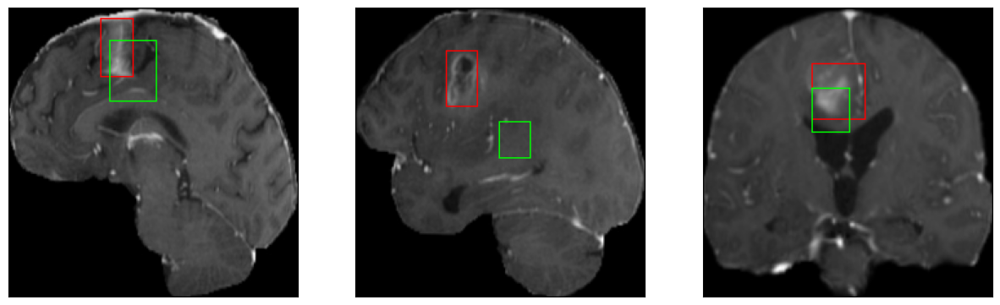

52/52 [==============================] - 32s 613ms/step - loss: 7.0293 - IoU: 0.5681 - val_loss: 6.7212 - val_IoU: 0.6078
Epoch 18/100
52/52 [==============================] - ETA: 0s - loss: 6.8555 - IoU: 0.5770
Epoch 18: val_loss did not improve from 6.72118
8/8 [==============================] - 1s 144ms/step


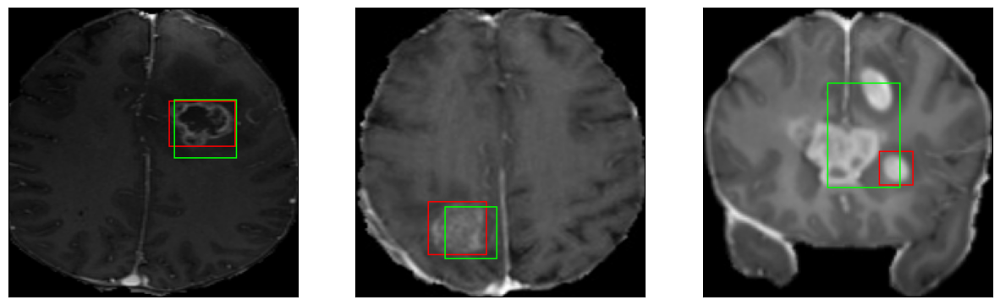

52/52 [==============================] - 20s 384ms/step - loss: 6.8555 - IoU: 0.5770 - val_loss: 7.7675 - val_IoU: 0.5555
Epoch 19/100
52/52 [==============================] - ETA: 0s - loss: 6.7406 - IoU: 0.5776
Epoch 19: val_loss did not improve from 6.72118
8/8 [==============================] - 1s 147ms/step


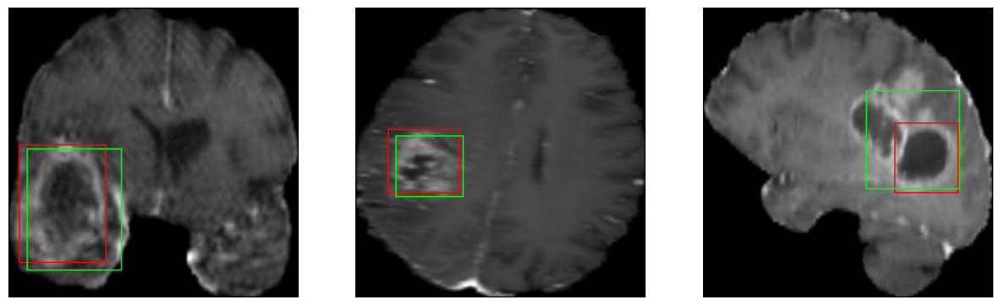

52/52 [==============================] - 20s 390ms/step - loss: 6.7406 - IoU: 0.5776 - val_loss: 7.4464 - val_IoU: 0.5307
Epoch 20/100
52/52 [==============================] - ETA: 0s - loss: 6.3805 - IoU: 0.5975
Epoch 20: val_loss improved from 6.72118 to 6.71933, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 141ms/step


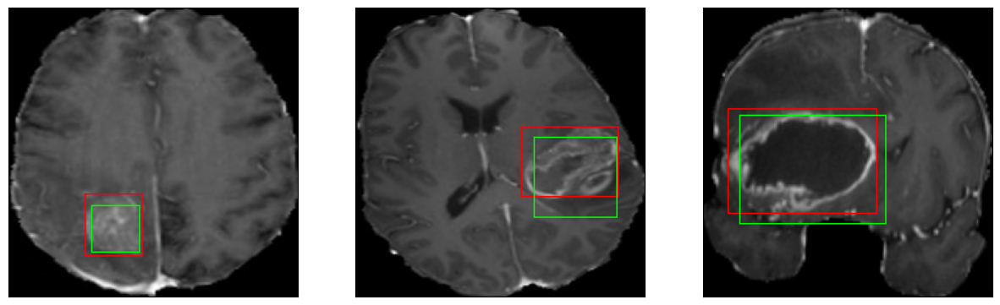

52/52 [==============================] - 44s 861ms/step - loss: 6.3805 - IoU: 0.5975 - val_loss: 6.7193 - val_IoU: 0.5901
Epoch 21/100
52/52 [==============================] - ETA: 0s - loss: 6.3277 - IoU: 0.5995
Epoch 21: val_loss improved from 6.71933 to 6.45280, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


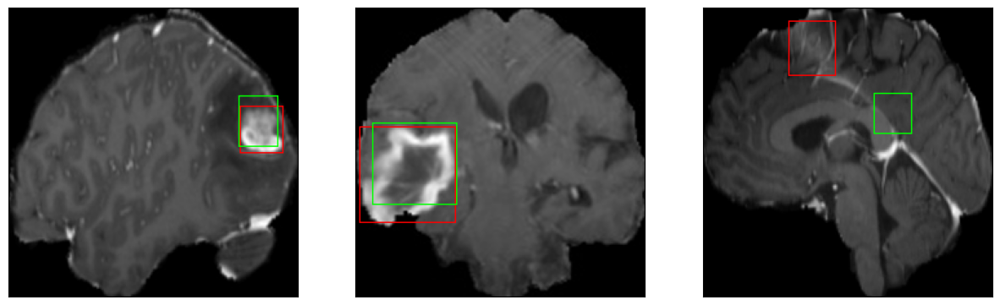

52/52 [==============================] - 36s 701ms/step - loss: 6.3277 - IoU: 0.5995 - val_loss: 6.4528 - val_IoU: 0.6202
Epoch 22/100
52/52 [==============================] - ETA: 0s - loss: 6.1418 - IoU: 0.6097
Epoch 22: val_loss did not improve from 6.45280
8/8 [==============================] - 1s 150ms/step


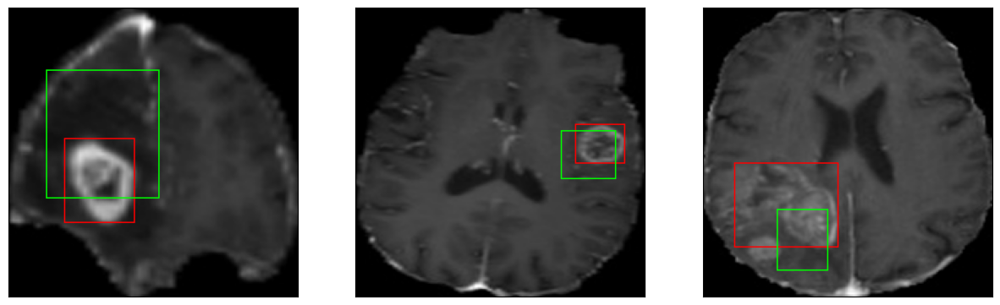

52/52 [==============================] - 20s 391ms/step - loss: 6.1418 - IoU: 0.6097 - val_loss: 6.6510 - val_IoU: 0.6084
Epoch 23/100
52/52 [==============================] - ETA: 0s - loss: 6.1436 - IoU: 0.6056
Epoch 23: val_loss improved from 6.45280 to 6.37289, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


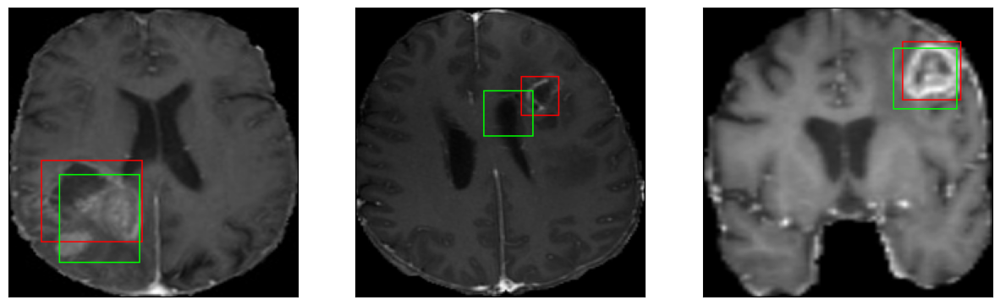

52/52 [==============================] - 39s 757ms/step - loss: 6.1436 - IoU: 0.6056 - val_loss: 6.3729 - val_IoU: 0.6268
Epoch 24/100
52/52 [==============================] - ETA: 0s - loss: 6.0987 - IoU: 0.6049
Epoch 24: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 143ms/step


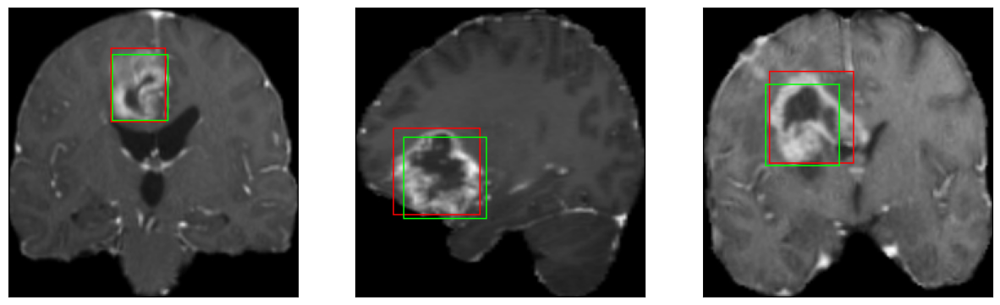

52/52 [==============================] - 20s 391ms/step - loss: 6.0987 - IoU: 0.6049 - val_loss: 7.3442 - val_IoU: 0.5988
Epoch 25/100
52/52 [==============================] - ETA: 0s - loss: 6.1743 - IoU: 0.6014
Epoch 25: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 145ms/step


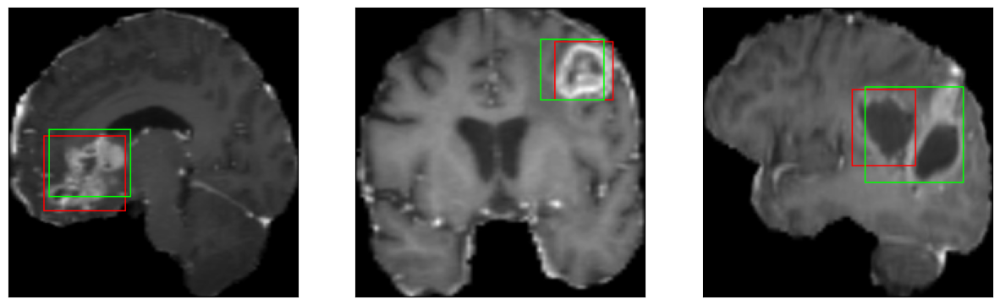

52/52 [==============================] - 20s 386ms/step - loss: 6.1743 - IoU: 0.6014 - val_loss: 8.6529 - val_IoU: 0.5483
Epoch 26/100
52/52 [==============================] - ETA: 0s - loss: 6.1032 - IoU: 0.6100
Epoch 26: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 144ms/step


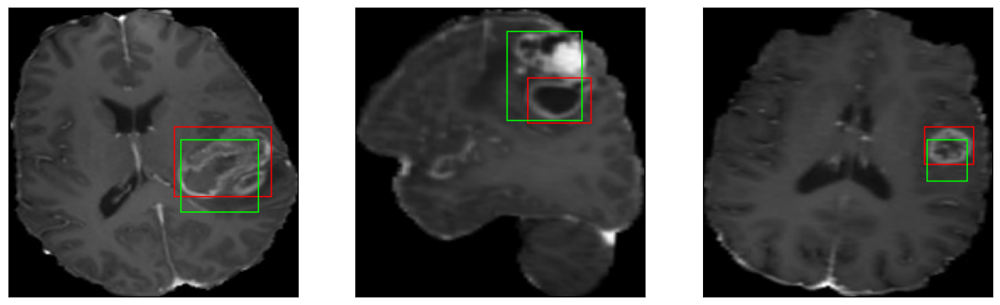

52/52 [==============================] - 20s 394ms/step - loss: 6.1032 - IoU: 0.6100 - val_loss: 6.7668 - val_IoU: 0.5848
Epoch 27/100
52/52 [==============================] - ETA: 0s - loss: 6.1743 - IoU: 0.5973
Epoch 27: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 142ms/step


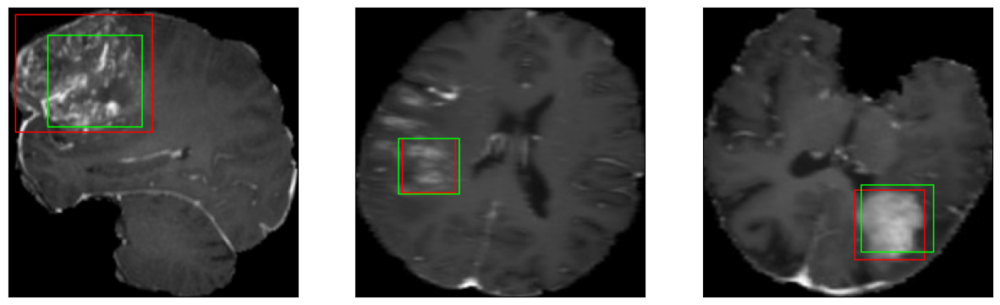

52/52 [==============================] - 20s 378ms/step - loss: 6.1743 - IoU: 0.5973 - val_loss: 7.0454 - val_IoU: 0.5968
Epoch 28/100
52/52 [==============================] - ETA: 0s - loss: 6.0755 - IoU: 0.6084
Epoch 28: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 145ms/step


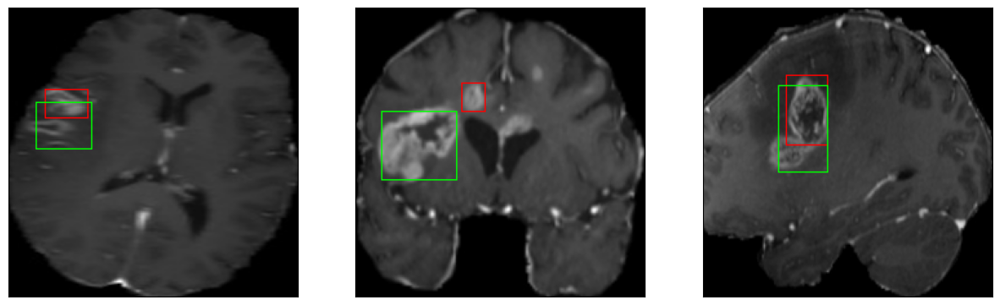

52/52 [==============================] - 20s 382ms/step - loss: 6.0755 - IoU: 0.6084 - val_loss: 7.2665 - val_IoU: 0.5730
Epoch 29/100
52/52 [==============================] - ETA: 0s - loss: 6.1018 - IoU: 0.6019
Epoch 29: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 144ms/step


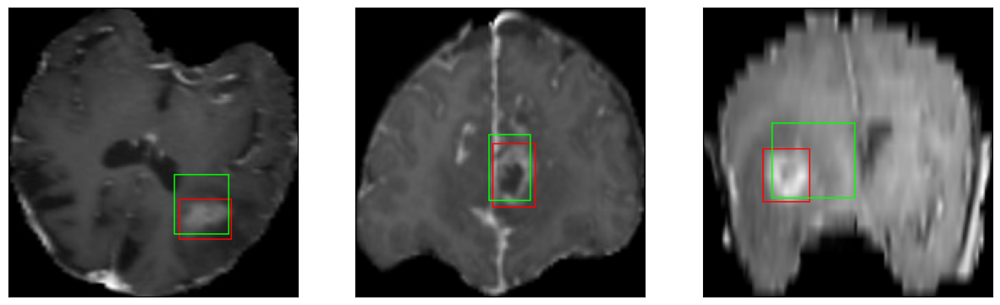

52/52 [==============================] - 20s 385ms/step - loss: 6.1018 - IoU: 0.6019 - val_loss: 11.1347 - val_IoU: 0.5595
Epoch 30/100
52/52 [==============================] - ETA: 0s - loss: 6.5711 - IoU: 0.5827
Epoch 30: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 144ms/step


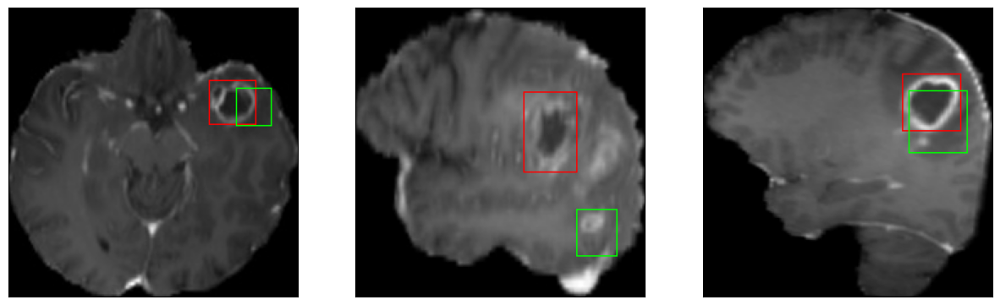

52/52 [==============================] - 20s 388ms/step - loss: 6.5711 - IoU: 0.5827 - val_loss: 13.0092 - val_IoU: 0.4369
Epoch 31/100
52/52 [==============================] - ETA: 0s - loss: 6.7284 - IoU: 0.5734
Epoch 31: val_loss did not improve from 6.37289
8/8 [==============================] - 1s 143ms/step


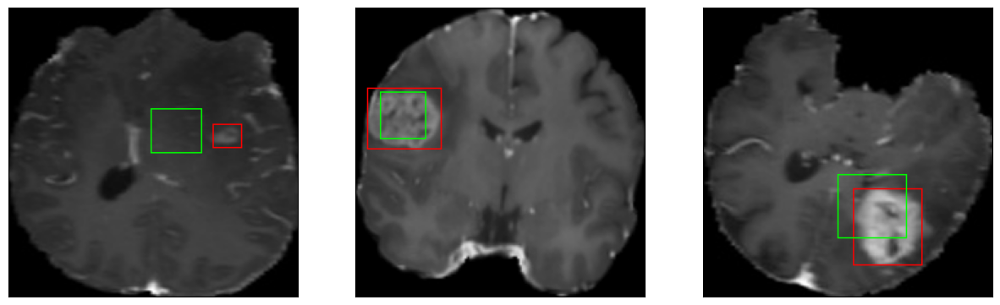

52/52 [==============================] - 20s 389ms/step - loss: 6.7284 - IoU: 0.5734 - val_loss: 12.7560 - val_IoU: 0.4807
Epoch 32/100
52/52 [==============================] - ETA: 0s - loss: 6.3673 - IoU: 0.5979
Epoch 32: val_loss improved from 6.37289 to 6.12992, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


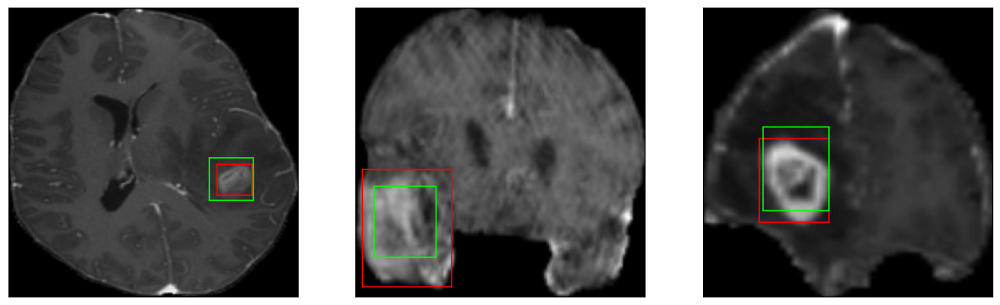

52/52 [==============================] - 37s 710ms/step - loss: 6.3673 - IoU: 0.5979 - val_loss: 6.1299 - val_IoU: 0.6162
Epoch 33/100
52/52 [==============================] - ETA: 0s - loss: 5.8026 - IoU: 0.6215
Epoch 33: val_loss improved from 6.12992 to 5.93909, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


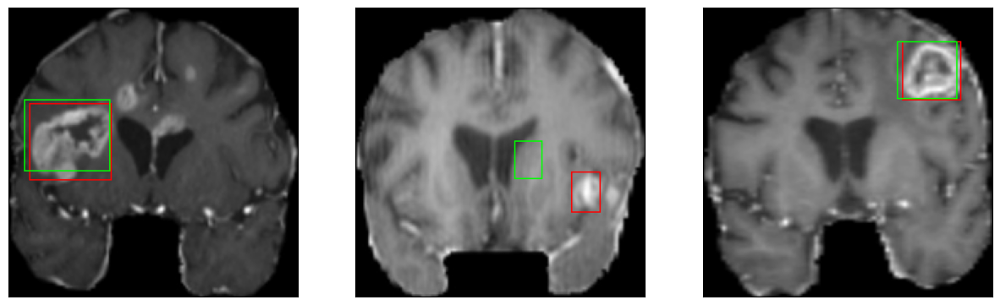

52/52 [==============================] - 40s 776ms/step - loss: 5.8026 - IoU: 0.6215 - val_loss: 5.9391 - val_IoU: 0.6342
Epoch 34/100
52/52 [==============================] - ETA: 0s - loss: 5.6006 - IoU: 0.6318
Epoch 34: val_loss did not improve from 5.93909
8/8 [==============================] - 1s 147ms/step


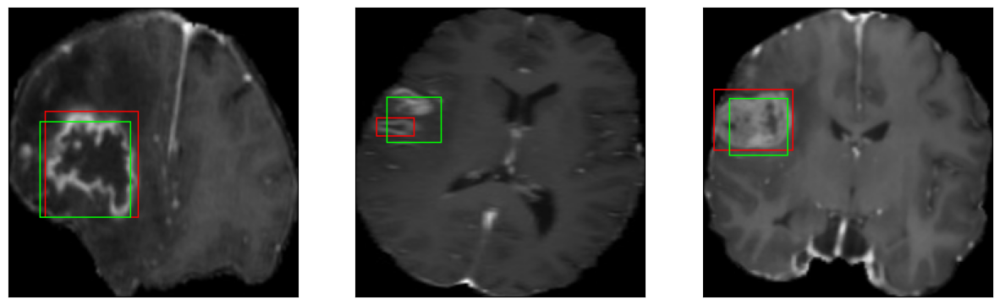

52/52 [==============================] - 20s 389ms/step - loss: 5.6006 - IoU: 0.6318 - val_loss: 6.1093 - val_IoU: 0.6397
Epoch 35/100
52/52 [==============================] - ETA: 0s - loss: 5.6907 - IoU: 0.6240
Epoch 35: val_loss did not improve from 5.93909
8/8 [==============================] - 1s 146ms/step


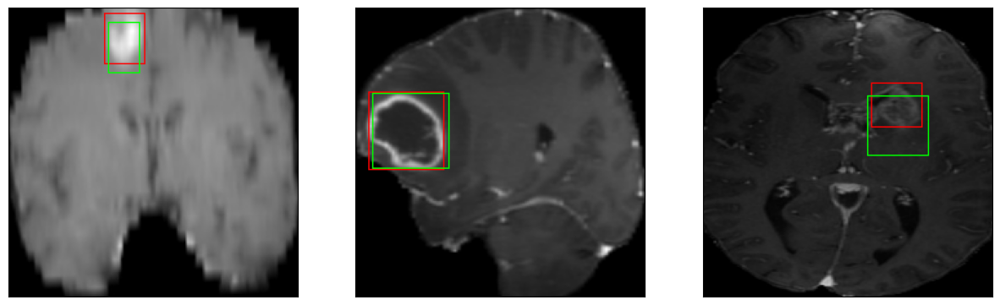

52/52 [==============================] - 20s 391ms/step - loss: 5.6907 - IoU: 0.6240 - val_loss: 6.5339 - val_IoU: 0.6171
Epoch 36/100
52/52 [==============================] - ETA: 0s - loss: 5.5882 - IoU: 0.6247
Epoch 36: val_loss did not improve from 5.93909
8/8 [==============================] - 1s 141ms/step


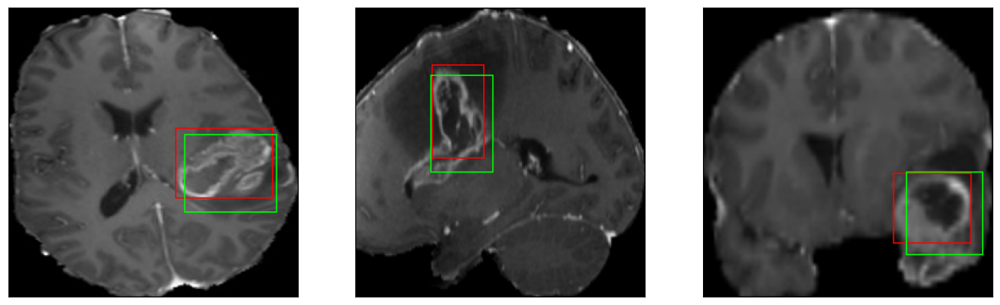

52/52 [==============================] - 20s 383ms/step - loss: 5.5882 - IoU: 0.6247 - val_loss: 8.3130 - val_IoU: 0.4680
Epoch 37/100
52/52 [==============================] - ETA: 0s - loss: 5.7519 - IoU: 0.6233
Epoch 37: val_loss improved from 5.93909 to 5.90228, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


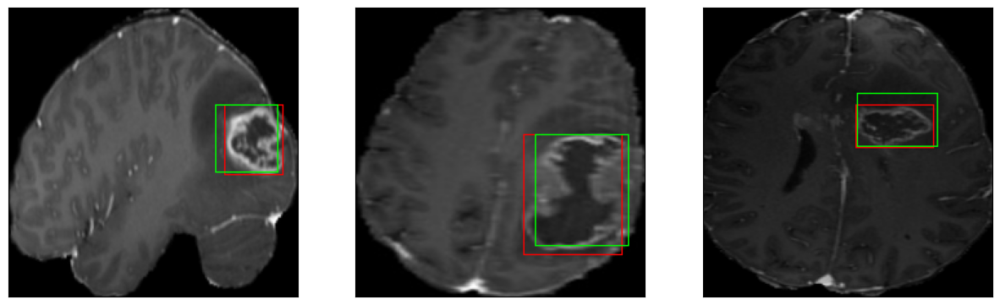

52/52 [==============================] - 38s 743ms/step - loss: 5.7519 - IoU: 0.6233 - val_loss: 5.9023 - val_IoU: 0.6491
Epoch 38/100
52/52 [==============================] - ETA: 0s - loss: 5.4282 - IoU: 0.6364
Epoch 38: val_loss improved from 5.90228 to 5.69155, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


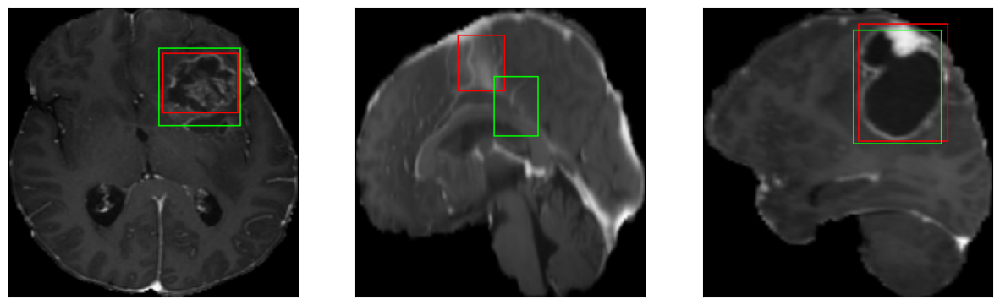

52/52 [==============================] - 34s 669ms/step - loss: 5.4282 - IoU: 0.6364 - val_loss: 5.6916 - val_IoU: 0.6515
Epoch 39/100
52/52 [==============================] - ETA: 0s - loss: 5.2224 - IoU: 0.6423
Epoch 39: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 147ms/step


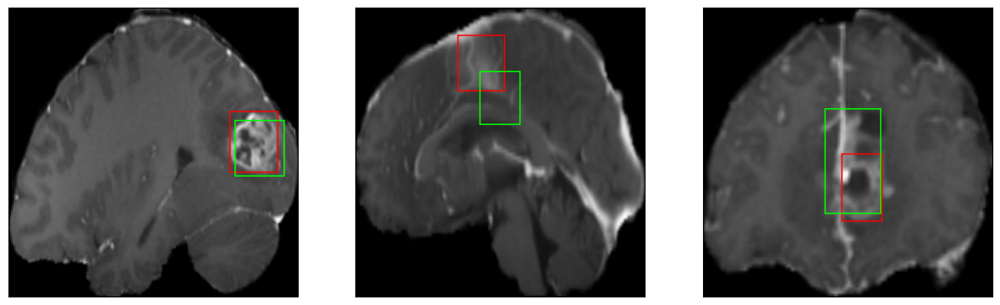

52/52 [==============================] - 21s 395ms/step - loss: 5.2224 - IoU: 0.6423 - val_loss: 5.9051 - val_IoU: 0.6592
Epoch 40/100
52/52 [==============================] - ETA: 0s - loss: 5.5991 - IoU: 0.6210
Epoch 40: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 145ms/step


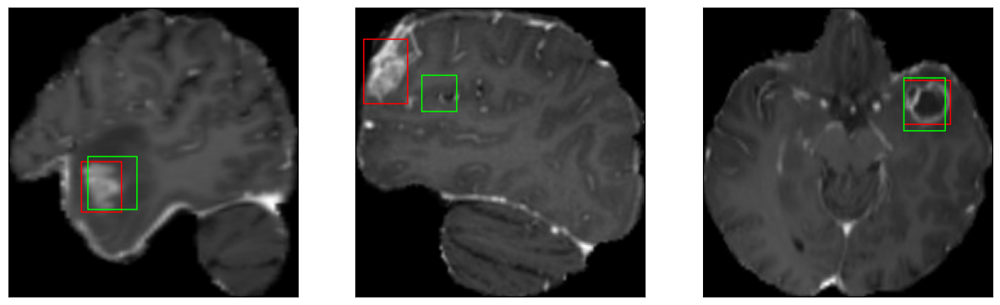

52/52 [==============================] - 20s 387ms/step - loss: 5.5991 - IoU: 0.6210 - val_loss: 6.3206 - val_IoU: 0.6169
Epoch 41/100
52/52 [==============================] - ETA: 0s - loss: 5.2887 - IoU: 0.6404
Epoch 41: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 147ms/step


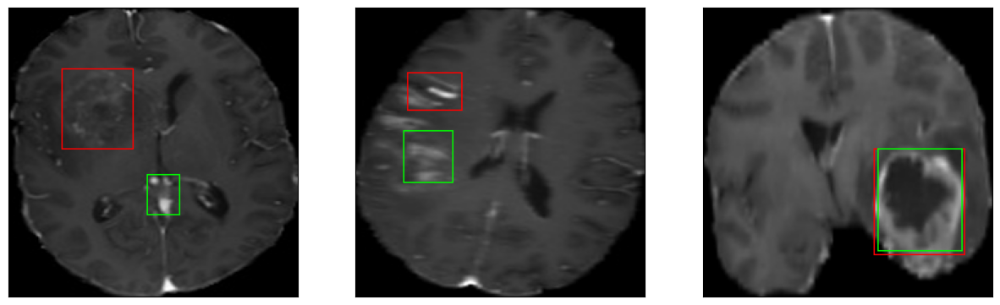

52/52 [==============================] - 21s 398ms/step - loss: 5.2887 - IoU: 0.6404 - val_loss: 6.2205 - val_IoU: 0.6407
Epoch 42/100
52/52 [==============================] - ETA: 0s - loss: 5.4242 - IoU: 0.6383
Epoch 42: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 150ms/step


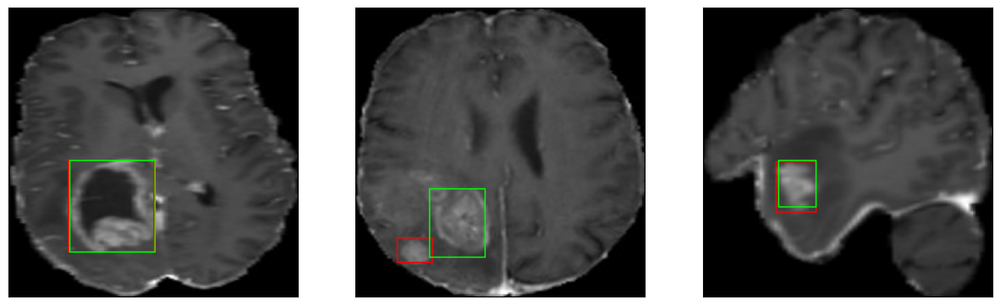

52/52 [==============================] - 20s 393ms/step - loss: 5.4242 - IoU: 0.6383 - val_loss: 6.0500 - val_IoU: 0.6249
Epoch 43/100
52/52 [==============================] - ETA: 0s - loss: 5.2166 - IoU: 0.6412
Epoch 43: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 147ms/step


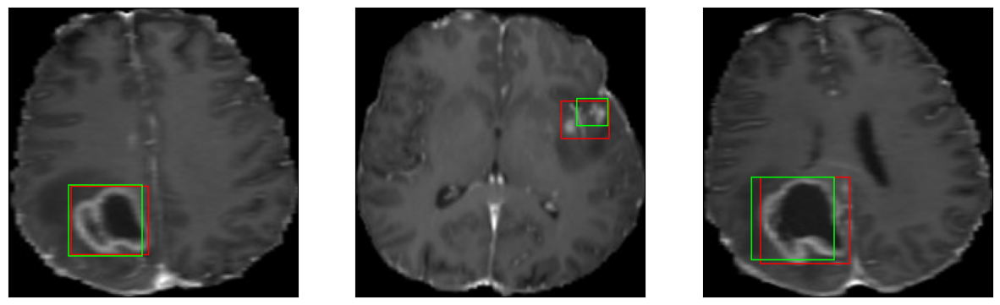

52/52 [==============================] - 20s 391ms/step - loss: 5.2166 - IoU: 0.6412 - val_loss: 5.9036 - val_IoU: 0.6449
Epoch 44/100
52/52 [==============================] - ETA: 0s - loss: 5.2837 - IoU: 0.6440
Epoch 44: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 146ms/step


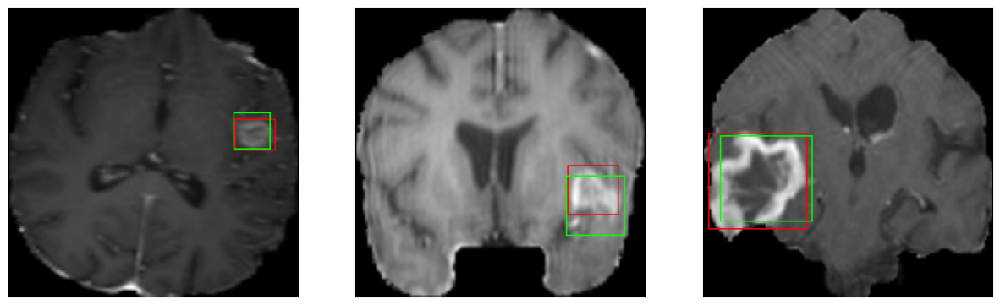

52/52 [==============================] - 20s 392ms/step - loss: 5.2837 - IoU: 0.6440 - val_loss: 8.2864 - val_IoU: 0.5656
Epoch 45/100
52/52 [==============================] - ETA: 0s - loss: 5.2466 - IoU: 0.6511
Epoch 45: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 143ms/step


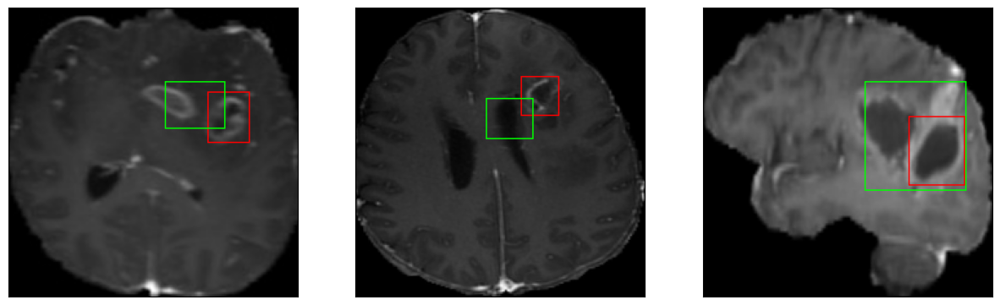

52/52 [==============================] - 20s 386ms/step - loss: 5.2466 - IoU: 0.6511 - val_loss: 6.0363 - val_IoU: 0.6440
Epoch 46/100
52/52 [==============================] - ETA: 0s - loss: 5.0494 - IoU: 0.6529
Epoch 46: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 144ms/step


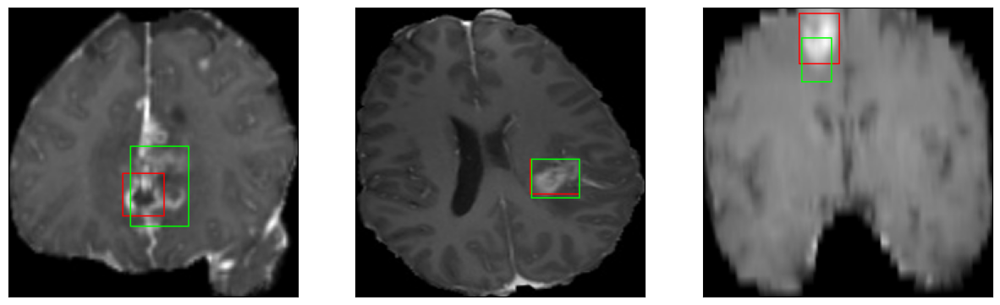

52/52 [==============================] - 20s 391ms/step - loss: 5.0494 - IoU: 0.6529 - val_loss: 6.3187 - val_IoU: 0.6399
Epoch 47/100
52/52 [==============================] - ETA: 0s - loss: 5.0280 - IoU: 0.6597
Epoch 47: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 147ms/step


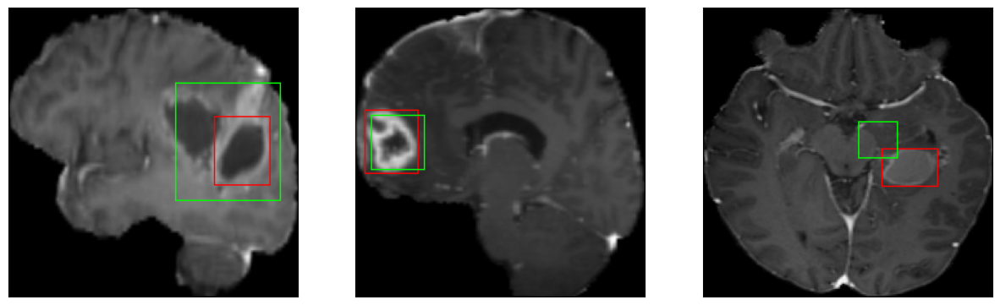

52/52 [==============================] - 20s 384ms/step - loss: 5.0280 - IoU: 0.6597 - val_loss: 6.7251 - val_IoU: 0.5820
Epoch 48/100
52/52 [==============================] - ETA: 0s - loss: 5.1557 - IoU: 0.6414
Epoch 48: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 145ms/step


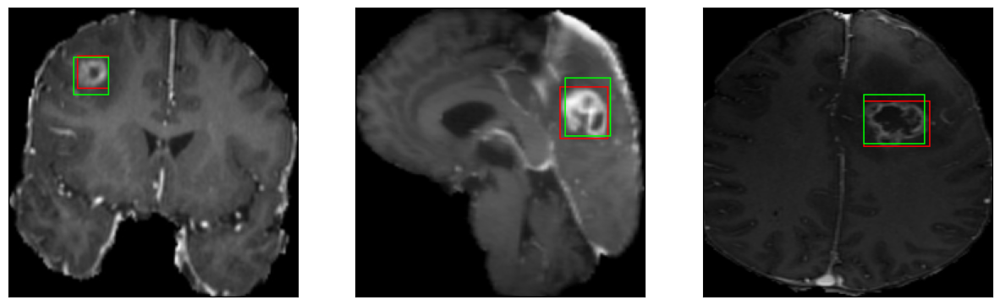

52/52 [==============================] - 20s 386ms/step - loss: 5.1557 - IoU: 0.6414 - val_loss: 5.7668 - val_IoU: 0.6561
Epoch 49/100
52/52 [==============================] - ETA: 0s - loss: 5.2441 - IoU: 0.6462
Epoch 49: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 143ms/step


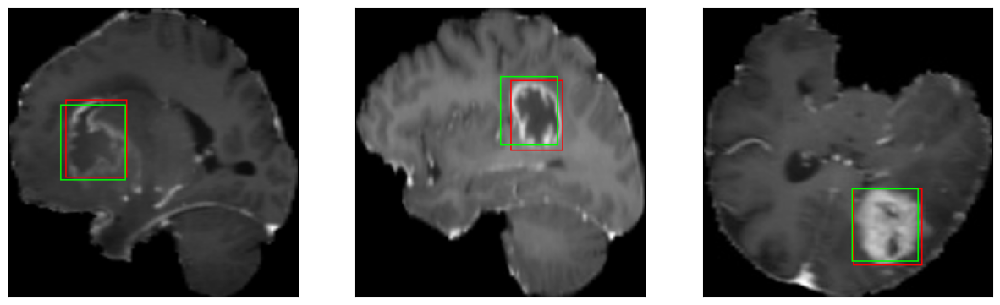

52/52 [==============================] - 20s 383ms/step - loss: 5.2441 - IoU: 0.6462 - val_loss: 5.7768 - val_IoU: 0.6491
Epoch 50/100
52/52 [==============================] - ETA: 0s - loss: 4.8941 - IoU: 0.6590
Epoch 50: val_loss did not improve from 5.69155
8/8 [==============================] - 1s 146ms/step


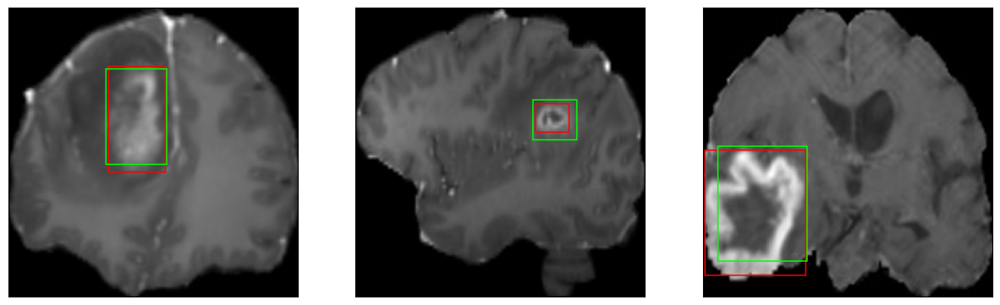

52/52 [==============================] - 20s 395ms/step - loss: 4.8941 - IoU: 0.6590 - val_loss: 6.3986 - val_IoU: 0.6211
Epoch 51/100
52/52 [==============================] - ETA: 0s - loss: 5.1067 - IoU: 0.6502
Epoch 51: val_loss improved from 5.69155 to 5.45775, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


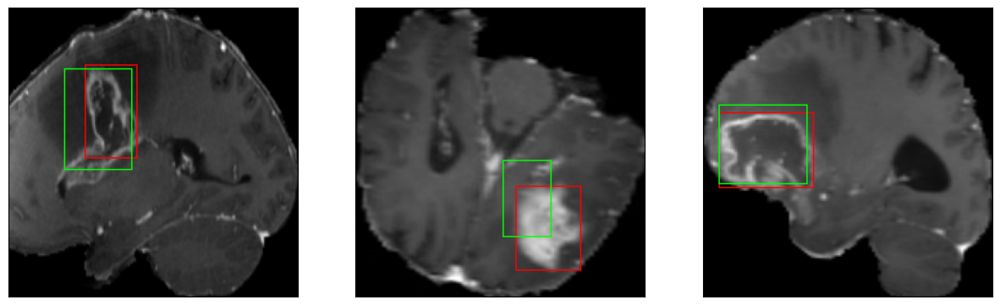

52/52 [==============================] - 36s 702ms/step - loss: 5.1067 - IoU: 0.6502 - val_loss: 5.4577 - val_IoU: 0.6571
Epoch 52/100
52/52 [==============================] - ETA: 0s - loss: 5.0122 - IoU: 0.6562
Epoch 52: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 148ms/step


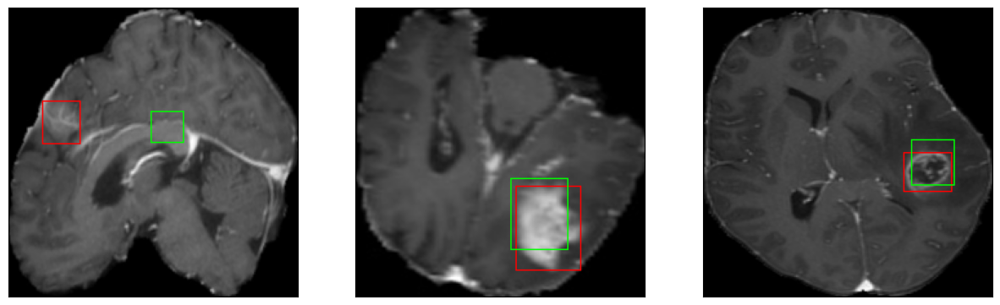

52/52 [==============================] - 20s 394ms/step - loss: 5.0122 - IoU: 0.6562 - val_loss: 5.8375 - val_IoU: 0.6670
Epoch 53/100
52/52 [==============================] - ETA: 0s - loss: 5.0966 - IoU: 0.6470
Epoch 53: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 150ms/step


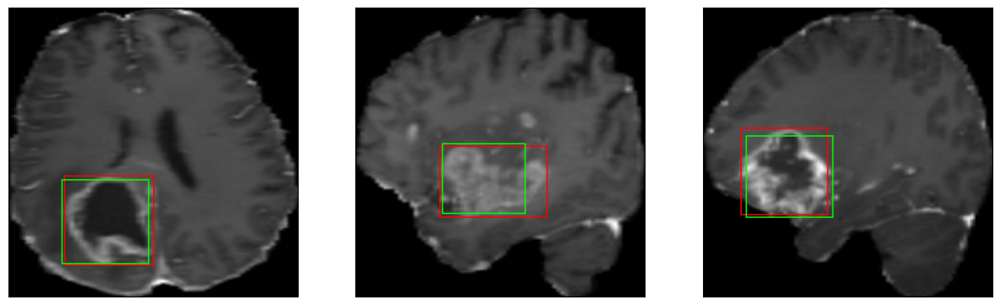

52/52 [==============================] - 20s 386ms/step - loss: 5.0966 - IoU: 0.6470 - val_loss: 5.5384 - val_IoU: 0.6792
Epoch 54/100
52/52 [==============================] - ETA: 0s - loss: 5.1248 - IoU: 0.6478
Epoch 54: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 149ms/step


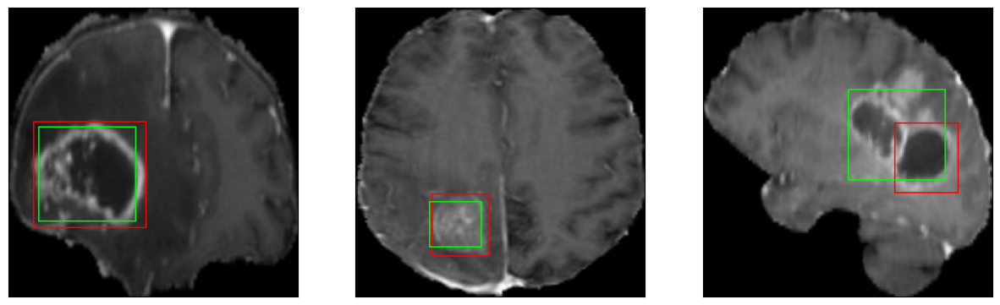

52/52 [==============================] - 20s 390ms/step - loss: 5.1248 - IoU: 0.6478 - val_loss: 6.1480 - val_IoU: 0.6526
Epoch 55/100
52/52 [==============================] - ETA: 0s - loss: 5.1420 - IoU: 0.6432
Epoch 55: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


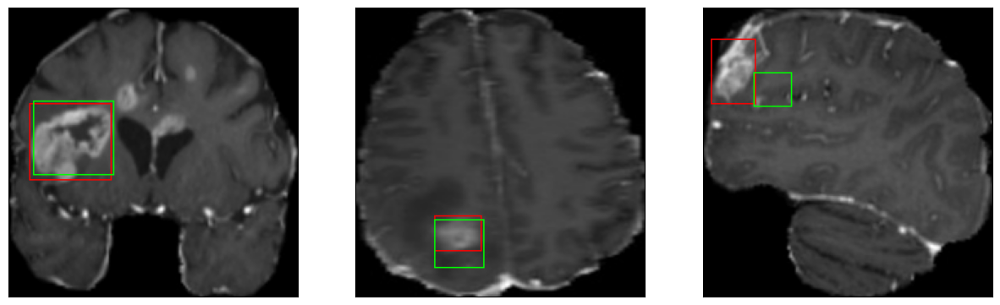

52/52 [==============================] - 20s 385ms/step - loss: 5.1420 - IoU: 0.6432 - val_loss: 6.2301 - val_IoU: 0.6370
Epoch 56/100
52/52 [==============================] - ETA: 0s - loss: 5.0122 - IoU: 0.6506
Epoch 56: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


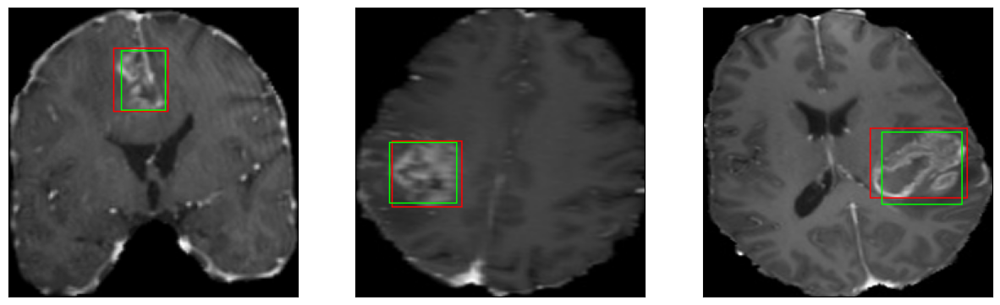

52/52 [==============================] - 20s 389ms/step - loss: 5.0122 - IoU: 0.6506 - val_loss: 6.2953 - val_IoU: 0.6464
Epoch 57/100
52/52 [==============================] - ETA: 0s - loss: 4.9438 - IoU: 0.6585
Epoch 57: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 145ms/step


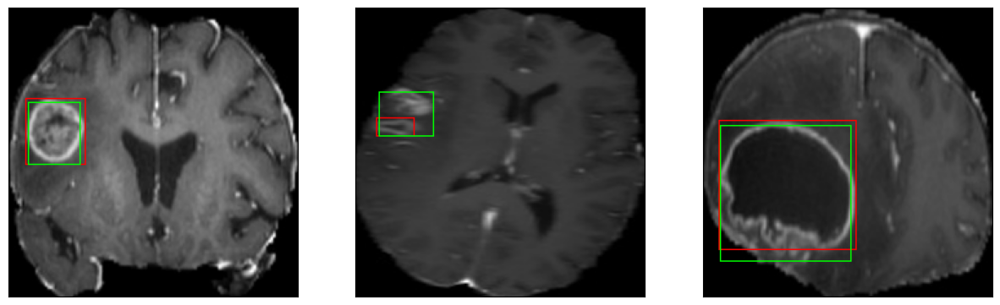

52/52 [==============================] - 20s 387ms/step - loss: 4.9438 - IoU: 0.6585 - val_loss: 5.8896 - val_IoU: 0.6592
Epoch 58/100
52/52 [==============================] - ETA: 0s - loss: 4.8036 - IoU: 0.6741
Epoch 58: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


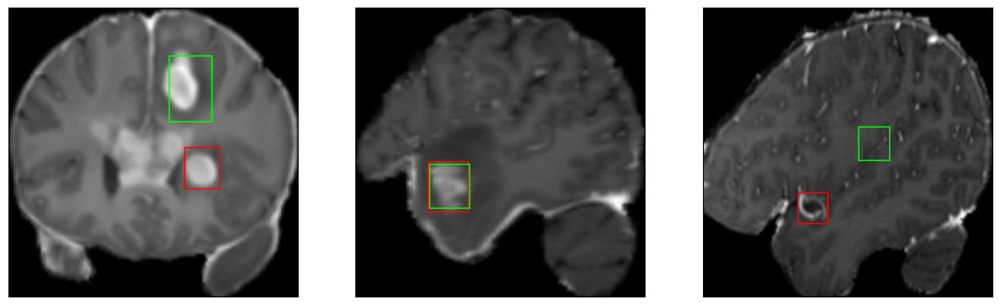

52/52 [==============================] - 20s 387ms/step - loss: 4.8036 - IoU: 0.6741 - val_loss: 5.7126 - val_IoU: 0.6579
Epoch 59/100
52/52 [==============================] - ETA: 0s - loss: 4.9066 - IoU: 0.6584
Epoch 59: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 143ms/step


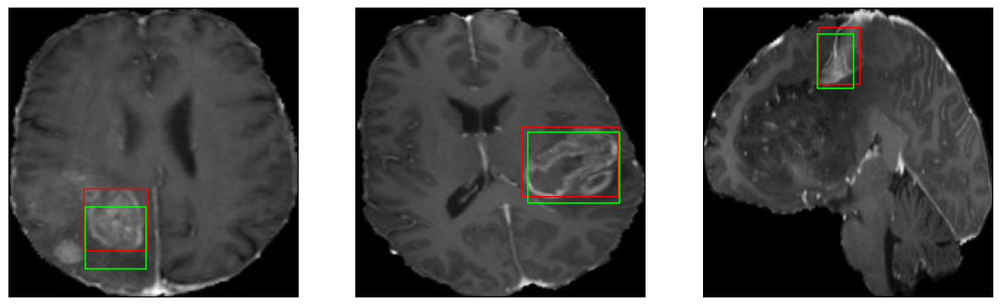

52/52 [==============================] - 20s 390ms/step - loss: 4.9066 - IoU: 0.6584 - val_loss: 5.5295 - val_IoU: 0.6512
Epoch 60/100
52/52 [==============================] - ETA: 0s - loss: 5.0497 - IoU: 0.6483
Epoch 60: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 145ms/step


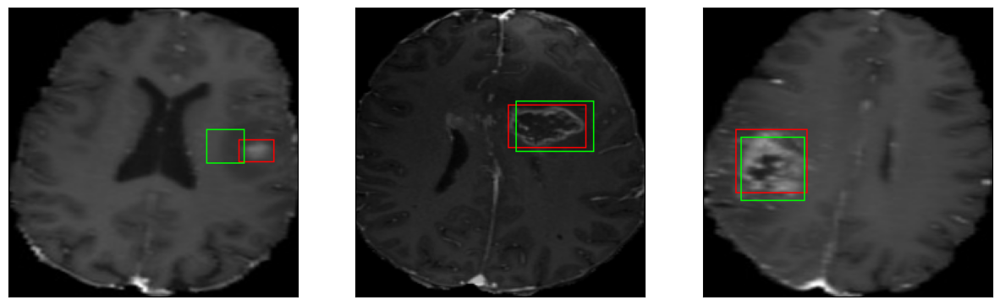

52/52 [==============================] - 21s 398ms/step - loss: 5.0497 - IoU: 0.6483 - val_loss: 5.9728 - val_IoU: 0.6374
Epoch 61/100
52/52 [==============================] - ETA: 0s - loss: 4.9557 - IoU: 0.6595
Epoch 61: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 145ms/step


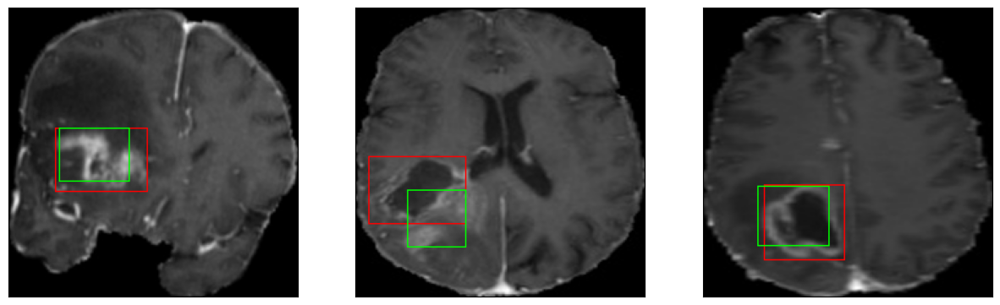

52/52 [==============================] - 20s 389ms/step - loss: 4.9557 - IoU: 0.6595 - val_loss: 7.3235 - val_IoU: 0.5418
Epoch 62/100
52/52 [==============================] - ETA: 0s - loss: 5.0052 - IoU: 0.6539
Epoch 62: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 147ms/step


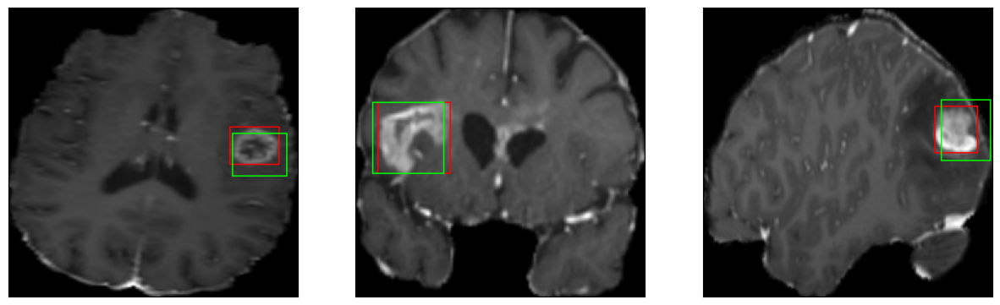

52/52 [==============================] - 21s 397ms/step - loss: 5.0052 - IoU: 0.6539 - val_loss: 7.0152 - val_IoU: 0.5911
Epoch 63/100
52/52 [==============================] - ETA: 0s - loss: 4.9425 - IoU: 0.6495
Epoch 63: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 147ms/step


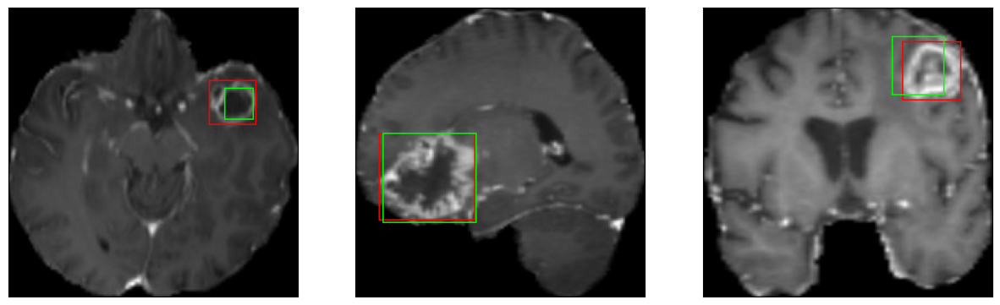

52/52 [==============================] - 20s 383ms/step - loss: 4.9425 - IoU: 0.6495 - val_loss: 6.0749 - val_IoU: 0.6316
Epoch 64/100
52/52 [==============================] - ETA: 0s - loss: 4.6886 - IoU: 0.6740
Epoch 64: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 150ms/step


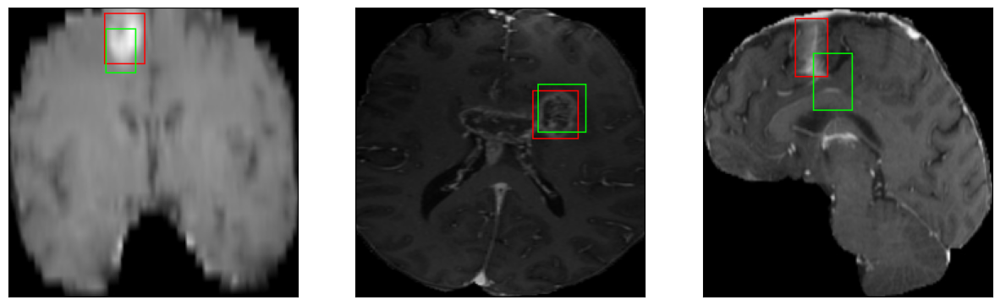

52/52 [==============================] - 20s 395ms/step - loss: 4.6886 - IoU: 0.6740 - val_loss: 6.0154 - val_IoU: 0.6327
Epoch 65/100
52/52 [==============================] - ETA: 0s - loss: 4.8343 - IoU: 0.6609
Epoch 65: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 145ms/step


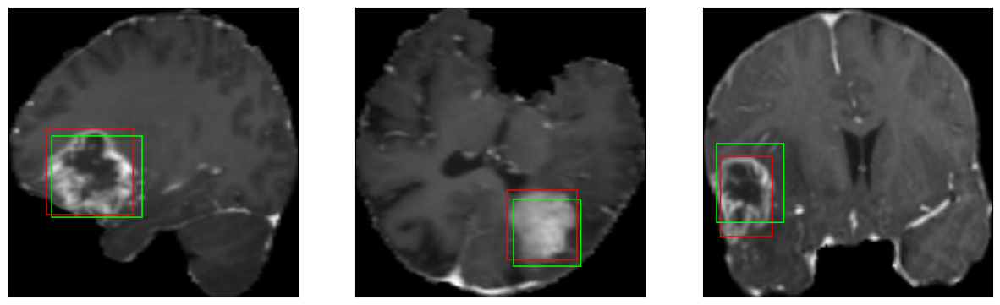

52/52 [==============================] - 20s 394ms/step - loss: 4.8343 - IoU: 0.6609 - val_loss: 6.3977 - val_IoU: 0.6321
Epoch 66/100
52/52 [==============================] - ETA: 0s - loss: 4.8334 - IoU: 0.6572
Epoch 66: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 144ms/step


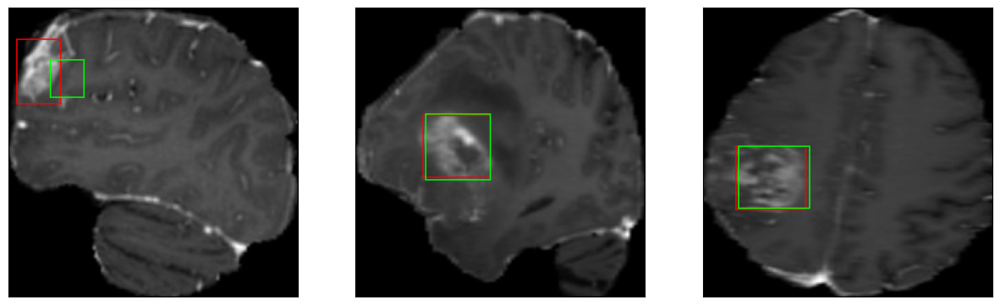

52/52 [==============================] - 20s 389ms/step - loss: 4.8334 - IoU: 0.6572 - val_loss: 6.1964 - val_IoU: 0.6347
Epoch 67/100
52/52 [==============================] - ETA: 0s - loss: 4.8603 - IoU: 0.6630
Epoch 67: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 148ms/step


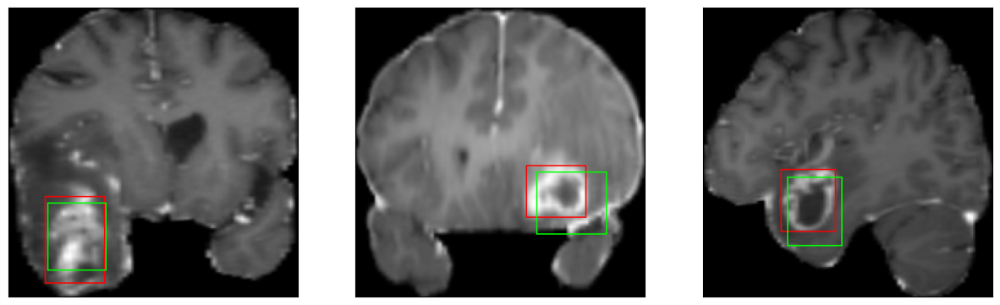

52/52 [==============================] - 20s 387ms/step - loss: 4.8603 - IoU: 0.6630 - val_loss: 6.8346 - val_IoU: 0.5912
Epoch 68/100
52/52 [==============================] - ETA: 0s - loss: 5.0987 - IoU: 0.6410
Epoch 68: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


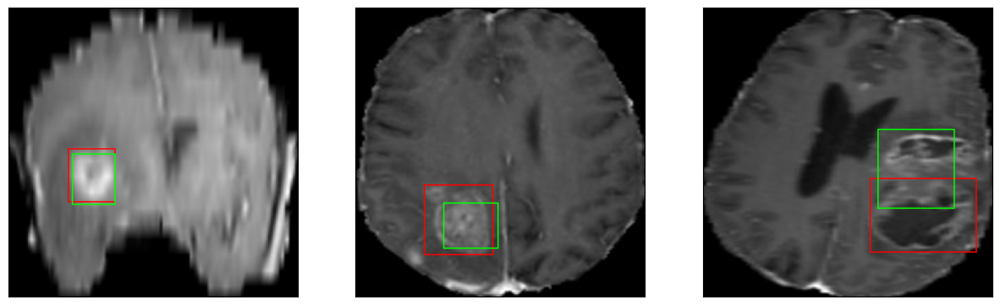

52/52 [==============================] - 20s 395ms/step - loss: 5.0987 - IoU: 0.6410 - val_loss: 5.7469 - val_IoU: 0.6410
Epoch 69/100
52/52 [==============================] - ETA: 0s - loss: 4.7200 - IoU: 0.6586
Epoch 69: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


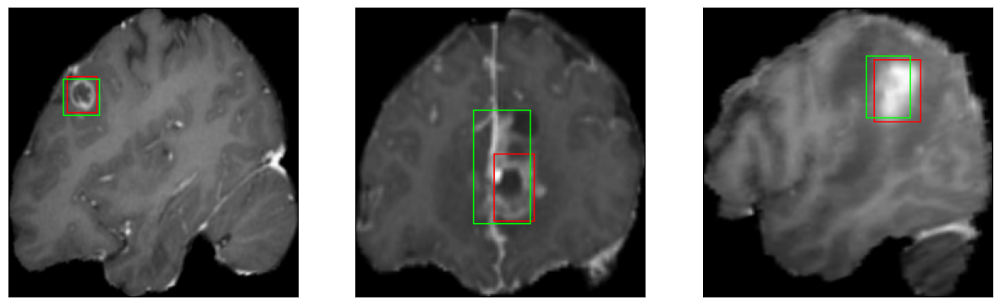

52/52 [==============================] - 20s 395ms/step - loss: 4.7200 - IoU: 0.6586 - val_loss: 6.0629 - val_IoU: 0.6369
Epoch 70/100
52/52 [==============================] - ETA: 0s - loss: 4.7475 - IoU: 0.6638
Epoch 70: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 147ms/step


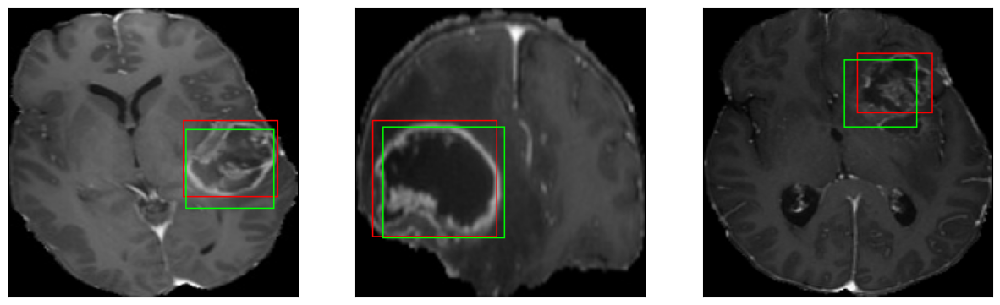

52/52 [==============================] - 20s 393ms/step - loss: 4.7475 - IoU: 0.6638 - val_loss: 6.1157 - val_IoU: 0.6474
Epoch 71/100
52/52 [==============================] - ETA: 0s - loss: 4.9783 - IoU: 0.6534
Epoch 71: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 145ms/step


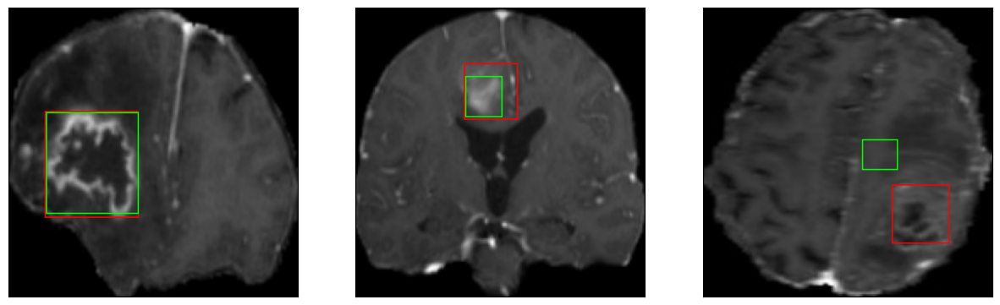

52/52 [==============================] - 21s 399ms/step - loss: 4.9783 - IoU: 0.6534 - val_loss: 6.3998 - val_IoU: 0.6206
Epoch 72/100
52/52 [==============================] - ETA: 0s - loss: 4.8588 - IoU: 0.6598
Epoch 72: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


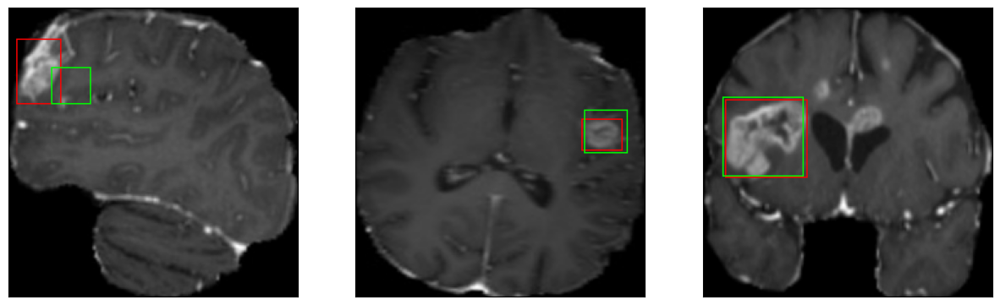

52/52 [==============================] - 20s 387ms/step - loss: 4.8588 - IoU: 0.6598 - val_loss: 6.0155 - val_IoU: 0.6440
Epoch 73/100
52/52 [==============================] - ETA: 0s - loss: 4.7614 - IoU: 0.6672
Epoch 73: val_loss did not improve from 5.45775
8/8 [==============================] - 1s 146ms/step


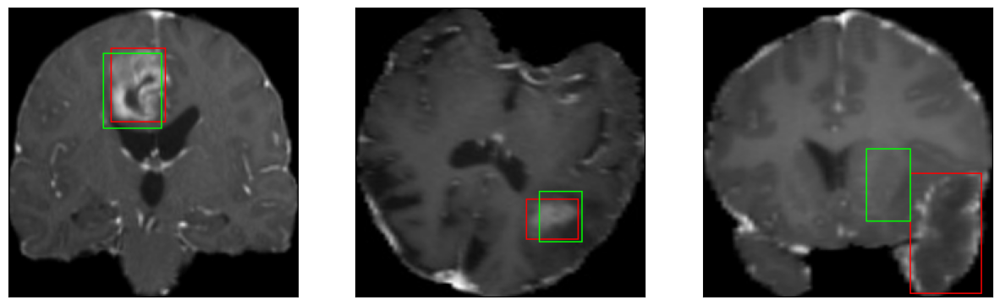

52/52 [==============================] - 20s 384ms/step - loss: 4.7614 - IoU: 0.6672 - val_loss: 6.1043 - val_IoU: 0.6368


In [26]:
hist = model.fit(
        train_dataset,
        epochs=100,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

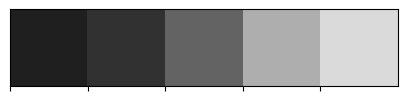

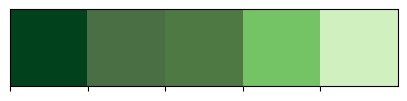

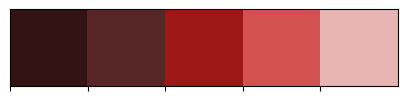

In [29]:
import seaborn as sns
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']

sns.palplot(colors_dark)
sns.palplot(colors_green)
sns.palplot(colors_red)

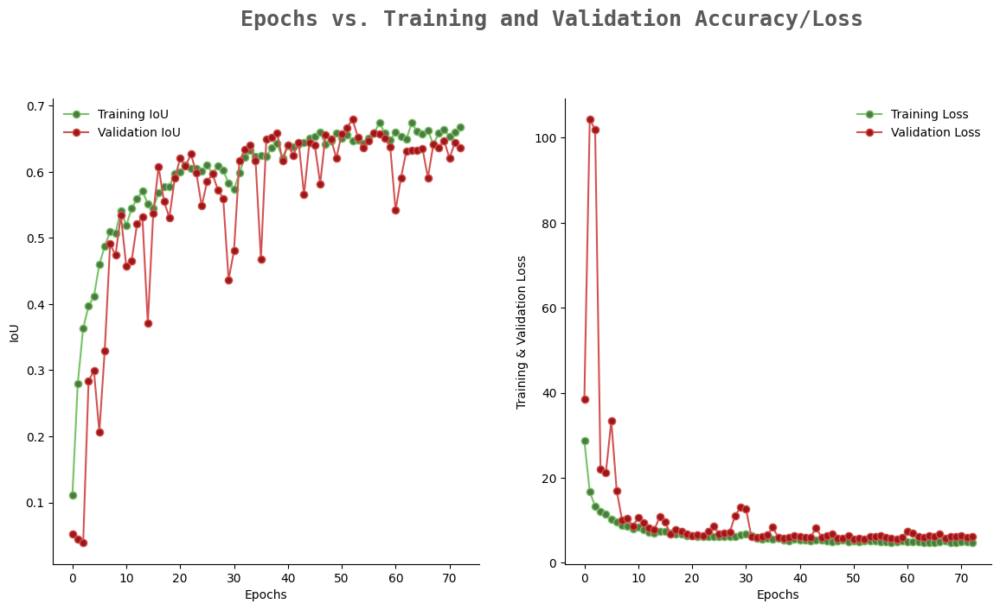

In [30]:
from warnings import filterwarnings
filterwarnings('ignore')

epochs = [i for i in range(73)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = hist.history['IoU']
train_loss = hist.history['loss']
val_acc = hist.history['val_IoU']
val_loss = hist.history['val_loss']

fig.text(s='Epochs vs. Training and Validation Accuracy/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training IoU')
ax[0].plot(epochs, val_acc, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation IoU')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('IoU')

sns.despine()
ax[1].plot(epochs, train_loss, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

In [31]:
model = tf.keras.models.load_model('./model_checkpoint_RESNET/model_RESNET.h5', compile=False)

In [32]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

In [33]:
model.evaluate(test_dataset)

15/15 [==============================] - 4s 93ms/step - loss: 8.6889 - IoU: 0.5750


[8.688899040222168, 0.5750494599342346]